# Feature Visualisation for Sport Image Classification 

**Introduction:**   Welcome to our interactive notebook dedicated to exploring feature visualisation for sport image classification. In this demonstration, we dive into the power of feature visualisation as a tool for understanding Convolutional Neural Networks (CNNs) and enhancing model interpretability.  

Feature visualisation enables us to generate visual representations of the features learned by CNN layers. By visualising these features, we gain insights into how the network processes and interprets input data, thus facilitating a better understanding of its decision-making procisions. We primarily follow the approach outlined in the [Feature Visualizationlion](https://distill.pub/2017/feature-visualization/), which advocates for the use of feature visualisation to enhance model interpretability.  We propose to use apply feature visualisation through the omnixai pacakge which is available on our [XAI platform](https://hes-xplain.github.io/) platform, you can effortlessly extract and visualise features from a CNN model. We provide functionalities to explore and interpret these features, aiding in the analysis and understanding of the model's decision-making process.    

Our goal is to showcase how feature visualisation empowers users to gain deeper insights into CNN models and make informed decisions based on their interpretations. By the end of this demonstration, you'll have a comprehensive understanding of feature visualisation and its application in sport image classification.sificati   

**Outline:**  
1. Setup and Problem Statement.
2. Feature Visualisation Explanation
3. Feature Visualisation usage of omnixai
4. Results and analysis
5. Conclusion
6. Reference.


---
## Google Colab setup

This section prepares the notebook for use with Google Colaboratory. If applicable, change the following variable to **True**:

In [1]:
# Colab compatibility
use_colab = False

Prepare the code by downloading the code and installing required packages.

In [2]:
if use_colab:
    # ensure the directory is empty
    !rm -rf * .config

    !# install codebase from GitHub
    !git clone --no-checkout https://github.com/HES-XPLAIN/notebooks.git --depth=1 .
    !git config core.sparseCheckout true
    !git sparse-checkout set --cone
    !git sparse-checkout add use_case_sport_classification
    !git sparse-checkout reapply
    !git checkout main

    # adjust folder structure
    !mv use_case_sport_classification/* .
    !rm -rf use_case_sport_classification/

In [ ]:
if use_colab:
    # Install dependencies
    !pip install omnixai-community

When asked to, restart the session by clicking on the **"Restart Session"** button, then continue and execute the next cells.

## Workspace setup

This section download the required code and models from our GitHub and huggingface.co repositories.

Download the dataset and models.

In [3]:
# download and extract dataset
import zipfile
from huggingface_hub import hf_hub_download

REPO_ID = "HES-XPLAIN/SportsImageClassification"
FILENAME = "SportsImageClassification.zip"
dataset_file_path = hf_hub_download(repo_id=REPO_ID, filename=FILENAME, repo_type="dataset")
extract_path = 'data'

# Unzip the file
with zipfile.ZipFile(dataset_file_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

print(f"Dataset successfully extracted to: {extract_path}")

/home/remy/code/HES-XPLAIN/notebooks/.venv/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Dataset successfully extracted to: data


In [4]:
!mkdir -p models_weight
!curl -OL https://huggingface.co/HES-XPLAIN/sport_classification/resolve/main/VGGSportsImageClassification.pth -o VGGSportsImageClassification.pth
!mv *.pth models_weight/

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  1171  100  1171    0     0   4796      0 --:--:-- --:--:-- --:--:--  4799
100 1541M  100 1541M    0     0  34.7M      0  0:00:44  0:00:44 --:--:-- 34.3M


---
## Setup and Problem Statement

The sport image classification dataset used in this use case consists of approximately 15,000 images, covering 100 different sports categories. This dataset, available on [Kaggle](https://www.kaggle.com/datasets/gpiosenka/sports-classification), contains a total of 13,493 train images, 500 test images, and 500 validation images. The images are in JPG format and have dimensions of 224x224 pixels with 3 color channels.

**Download dataset**: To make a propoer use of this demo, the dataset will be automatically downloaded and extracted in the data folder. You can download it using the next cell or from our [Hugging Face repository](https://huggingface.co/datasets/HES-XPLAIN/SportsImageClassification).

**Problem Statement**: Our objective is to build a robust image classifier capable of accurately classifying sport images among the 100 predefined sports categories. The nature of the dataset, comprising images of various sports, makes it particularly suitable for introducing and visualizing XAI techniques.

In [5]:
# global imports

import torch
import json
import pandas as pd
import numpy as np
import torch.nn as nn

from PIL import Image
from torch.utils.data import DataLoader

from scripts.helpers import *

In [6]:
# use cuda if available

if torch.cuda.is_available():
    device = torch.device("cuda")
    print("Using CUDA (GPU)")
else:
    device = torch.device("cpu")
    print("CUDA (GPU) not available. Using CPU.")

Using CUDA (GPU)


In [7]:
from scripts.models import FineTunedVGG

# load trained model VGG
model = FineTunedVGG()
model = model.to(device)
model.eval()

# Specify the map_location argument when loading the model
load_path = "models_weight/VGGSportsImageClassification.pth"
checkpoint = torch.load(load_path, map_location=device)
model.load_state_dict(checkpoint["model_state_dict"])

# get loaders  using function define in scripts for this notebook
train_loader, valid_loader, test_loader = get_dataloaders()

# get a dictionary that links class names to integers, making it easier for us as we proceed in the notebook
with open('./data/idx_to_names.json', 'r') as file:
    idx_to_names = json.load(file)
names_to_idx = {v: k for k, v in idx_to_names.items()}

/tmp/ipykernel_51189/2754221221.py:10: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(load_path, map_location=device)


## Feature Visualisation 

Feature visualisation in the context of sport image classification refers to the process of generating visual representations of features learned by Convolutional Neural Networks (CNNs) during training. These visualisations provide insights into how the network interprets input data, revealing patterns and characteristics that influence classification decisions.

Feature visualisation is invaluable for understanding CNN models in sport image classification as it offers transparency and interpretability. By visualising learned features, we can uncover the specific attributes and patterns that the model relies on for classification. This allows us to verify the model's reasoning and identify potential biases or inconsistencies in its decision-making proces
 


Moreover, feature visualisation plays a crucial role in Explainable AI (XAI) by enhancing model interpretability. It enables stakeholders to understand and trust the decisions made by AI systems, fostering transparency and accountability. By incorporating feature visualisation into XAI workflows, we can ensure that AI models are not only accurate but also comprehensible and trustworthy, thus facilitating their widespread adoption and acceptance.


## Feature visualisation by optimization

Feature visualisation by optimization is a technique used to generate visual representations of features learned by neural networks by iteratively optimizing input images to maximally activate specific neurons, layers, or channels within the network. This approach involves starting from random noise or an arbitrary image and using optimization algorithms, typically gradient descent, to iteratively adjust the image to produce desired activations in the network.

OmniXAI offers a comprehensive solution for feature visualisation by optimization, providing tools and techniques to facilitate the generation of interpretable visual representations of neural network features. With OmniXAI, users can specify target neurons, layers, or channels within the network and define optimization objectives to guide the generation process.

The workflow typically involves initializing an input image, defining an objective function that quantifies the desired activation of the target features, and iteratively optimizing the input image to maximize this objective function. By repeatedly perturbing the input image in the direction that increases the desired activation, the optimization process gradually converges towards an image that elicits maximal activation in the target features.

This approach enables users to gain insights into the inner workings of neural networks by visualizing the features learned by different layers or neurons. By interpreting the generated images, users can better understand the representations encoded by the network and identify patterns or concepts that influence its decision-making process.

Overall, feature visualisation by optimization, facilitated by OmniXAI, provides a powerful tool for exploring and interpreting neural network representations, enhancing transparency and understanding in AI systems.


In [8]:
# let's look in our model 
# we can see there are a lot of layers, with a lof channels and a lot of neurons

model

FineTunedVGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, d

---
As explained in the [omnixai documentation](https://opensource.salesforce.com/OmniXAI/latest/index.html) or the [feature visualisation article](https://distill.pub/2017/feature-visualization/) we have to decide where to look. We can choose a layer or a channel or a neuron as target. 

Let's try using a random layer and then a random channel using the FeatureVisualizer API :

We need to set up an optimizer by choosing the target layer and the objective. Then we can generate explanations, meaning do the iteration process, and plot the result

Step: 300 |████████████████████████████████████████| 100.0% 


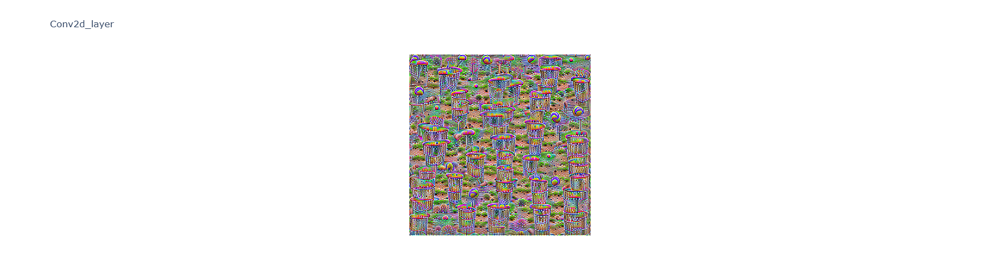

In [9]:
from omnixai_community.explainers.vision.specific.feature_visualization.visualizer import FeatureVisualizer

target_layer = model.features[28]
optimizer = FeatureVisualizer(
    model=model,
    objectives=[{"layer": target_layer, "type": "layer"}]
)
explanations = optimizer.explain(
    num_iterations=300,
    image_shape=(512, 512)
)
explanations.ipython_plot()

The image appears to be over-complex, with numerous structures present. This complexity arises from the fact that we are optimizing for the activation of an entire layer within the neural network. Furthermore, as this layer is positioned at the end of the model, it captures high-level features that encompass a wide range of visual patterns and concepts.

Despite our efforts to discern specific objects, such  some nets, basketsar, ball, and possibly a stick, commonly associated with sports, the sheer number of features in the image makes it challenging to isolate individual elements. The resulting image lacks clarity and is difficult to interpret due to the overwhelming presence of multiple structures.

The over-complexity of the image impedes our ability to conduct a precise analysis, as it becomes challenging to distinguish and interpret individual features. Moving forward, we may need to refine our optimization strategy or focus on specific regions of interest to generate clearer and more interpretable visual representations.


---
We can choose the same layer but we want to look into a channel only. It means that we optimize the input to maximize the answer of one channel (or filter) at at time among the target layer, let's do it for 3 random channels :

Step: 300 |████████████████████████████████████████| 100.0% 


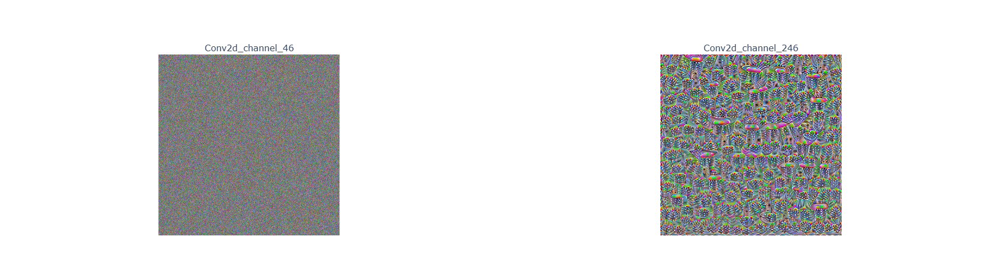

In [10]:
model.eval()
target_layer = model.features[28]
optimizer = FeatureVisualizer(
    model=model,
    objectives=[{"layer": target_layer, "type": "channel", "index": [46, 246]}]
)
explanations = optimizer.explain(
    num_iterations=300,
    image_shape=(512, 512)
)
explanations.ipython_plot()

It appears that channel 46 does not detect any discernible features. Even after optimization, the resulting feature resembles pure noise. In contrast, channel 246 exhibits some reaction to patterns, albeit they are hardly distinguishable. This highlights the significance of knowing where to focus our exploration efforts.

With a vast number of channels in a CNN model, some channels react strongly to specific features while others remain inactive. This variability underscores the importance of targeted exploration to identify meaningful patterns within the network's representations.

In the next cell, we'll explore one approach to refine our exploration and focus on specific channels for feature visualization.


One approach is to compute the activation during the forward pass of images of interest, for instance choosing only one class and compute feature values. By doing so, we can calculate the average activation for each channel of a feature and determine which channels are the most activated. This method provides valuable insights into where to focus our attention, particularly when targeting a specific class.

By identifying the channels that are most activated for a particular feature, we can gain a better understanding of the network's response to different inputs. This information can guide our exploration efforts, enabling us to focus on channels that are most relevant to the task at hand, such as classifying specific objects or patterns.

Here we choose a class, we compute the average features values for each layer and then return the most activated one by layer using thee little fuctions that you can customize available in scripts folder.


In [11]:
from scripts.helpers import loader_unique_class, store_activations, find_most_activated_filters

# define a loader with only curling image
dataloader = loader_unique_class('disc golf')

# get activations for all curling images
activations = store_activations(model, dataloader, device)

# find the most activated filters per conv2d layer
most_activated_filter = find_most_activated_filters(activations)
for layer, info in most_activated_filter.items():
    print(layer, info)

features.0 {'index': 12, 'mean_activation': 1.9095778}
features.2 {'index': 26, 'mean_activation': 2.053438}
features.5 {'index': 68, 'mean_activation': 4.3407006}
features.7 {'index': 80, 'mean_activation': 2.3936338}
features.10 {'index': 31, 'mean_activation': 3.712804}
features.12 {'index': 54, 'mean_activation': 2.9049444}
features.14 {'index': 216, 'mean_activation': 3.441565}
features.17 {'index': 276, 'mean_activation': 3.9106886}
features.19 {'index': 380, 'mean_activation': 3.5018563}
features.21 {'index': 244, 'mean_activation': 3.5008848}
features.24 {'index': 71, 'mean_activation': 2.103565}
features.26 {'index': 264, 'mean_activation': 2.4815195}
features.28 {'index': 335, 'mean_activation': 4.300102}


---
This function computes the average of the absolute value per channel of a convolutional layer. However, it can be easily modified to examine other aspects. The objective is to identify filters that may be informative during visualization. For example, you can experiment with options such as including or excluding the absolute value, using summation instead of averaging, or exploring layers other than conv2d
. For instance, for the layer `model.features[28]`, we find that the filte that is thes most activated on average for thedisc golfg classise filter3356.

 This information can guide our selection of filters for further exploration and visualization, allowing us to focus on the most informative features for the task at hand.

Let's have a look at it.


Step: 300 |████████████████████████████████████████| 100.0% 


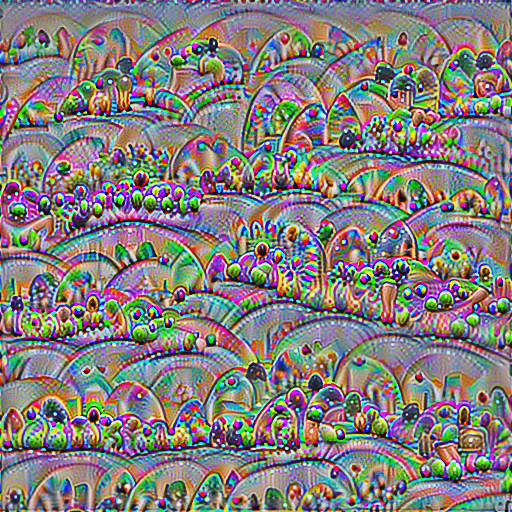

In [12]:
target_layer = model.features[28]
optimizer = FeatureVisualizer(
    model=model,
    objectives=[{"layer": target_layer, "type": "channel", "index": [335]}]
)
explanations = optimizer.explain(
    num_iterations=300,
    image_shape=(512, 512)
)
explanations.explanations[0]['image'][0]

---
We can identify circular shapes resembling discs used in disc golf, indicating that this filter is indeed utilized for classifying the disc golf class. However, there are numerous intricate patterns in the image, making it challenging to interpret. 


In conclusion, while such techniques can extract information, the results are often noisy, hindering comprehension. 

Additionally, there are numerous channels, layers, or neurons available for visualization, making it difficult to determine where to focus. By using our functions, we follow a predefined path to examine the most activated filters, yielding varying degrees of success. Alternatively, you can devise your own strategy to identify and visualize features you deem important.

---
## Conclusion 

`FeatureVisualizer` allow us to play with different feature but also choosing the number of iterations, the preconditioning, you can optimize on two objectives at the same time and even weighting each other. Tutorials from omniXAI on Feature Visualisation can be found [here](https://github.com/salesforce/OmniXAI/blob/main/tutorials/vision/feature_visualization_torch.ipynb).

As we mentionned it is hard to find visualisation that will directly make your model interpretable but this techniques is worth a try and the result are fun!

## References

1. [OmniXAI](https://arxiv.org/abs/2206.01612)
2. [Feature visualisation paper](https://distill.pub/2017/feature-visualization/)